### imports

In [70]:
import os
import pandas as pd
import folium
import numpy as np
import matplotlib.pyplot as plt
from zlib import crc32
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
import random
from sklearn.preprocessing import MinMaxScaler

### 1. Fetch data

In [71]:
csv_path = os.path.join('data')
all_files = os.listdir(csv_path)
csv_files = [f for f in all_files if f.count('rent') == 0 and f.count('.csv') == 1] # if you want rent-apartments, set 1 instad 0
df_list = []

for csv in csv_files:
    file_path = os.path.join(csv_path, csv)
    try:
        # Try reading the file using default UTF-8 encoding
        df = pd.read_csv(file_path)
        df_list.append(df)
    except Exception as e:
        print(f"Could not read file {csv}, error: {e}")

data = pd.concat(df_list, ignore_index=True)

print(f"Samples amount: {len(data)}")
data.head()

Samples amount: 134577


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
0,f8524536d4b09a0c8ccc0197ec9d7bde,szczecin,blockOfFlats,63.00,3.0,4.0,10.0,1980.0,53.378933,14.625296,...,0.413,condominium,concreteSlab,NaN,yes,yes,yes,no,yes,415000
1,accbe77d4b360fea9735f138a50608dd,szczecin,blockOfFlats,36.00,2.0,8.0,10.0,NaN,53.442692,14.559690,...,0.205,cooperative,concreteSlab,NaN,no,yes,yes,no,yes,395995
2,8373aa373dbc3fe7ca3b7434166b8766,szczecin,tenement,73.02,3.0,2.0,3.0,NaN,53.452222,14.553333,...,0.280,condominium,brick,NaN,no,no,no,no,no,565000
3,0a68cd14c44ec5140143ece75d739535,szczecin,tenement,87.60,3.0,2.0,3.0,NaN,53.435100,14.532900,...,0.087,condominium,brick,NaN,yes,yes,no,no,yes,640000
4,f66320e153c2441edc0fe293b54c8aeb,szczecin,blockOfFlats,66.00,3.0,1.0,3.0,NaN,53.410278,14.503611,...,0.514,condominium,NaN,NaN,no,no,no,no,no,759000


### 2. View raw data and clearing data set

In [72]:
# Data type

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134577 entries, 0 to 134576
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    134577 non-null  object 
 1   city                  134577 non-null  object 
 2   type                  104834 non-null  object 
 3   squareMeters          134577 non-null  float64
 4   rooms                 134577 non-null  float64
 5   floor                 110315 non-null  float64
 6   floorCount            132816 non-null  float64
 7   buildYear             112014 non-null  float64
 8   latitude              134577 non-null  float64
 9   longitude             134577 non-null  float64
 10  centreDistance        134577 non-null  float64
 11  poiCount              134577 non-null  float64
 12  schoolDistance        134438 non-null  float64
 13  clinicDistance        134029 non-null  float64
 14  postOfficeDistance    134388 non-null  float64
 15  

In [73]:
# Clean NaN and duplicates. Drop columns with lack of data.

dropped_columns = ['id','type', 'floor', 'buildYear', 'condition', 'buildingMaterial']
data.drop(dropped_columns, axis=1, inplace=True)
data.dropna(inplace=True)
data = data.drop_duplicates().reset_index(drop=True)

In [74]:
# Check number of null values.

print(f"Dataset amount: {len(data)}")
data.isna().sum()

Dataset amount: 66443


city                    0
squareMeters            0
rooms                   0
floorCount              0
latitude                0
longitude               0
centreDistance          0
poiCount                0
schoolDistance          0
clinicDistance          0
postOfficeDistance      0
kindergartenDistance    0
restaurantDistance      0
collegeDistance         0
pharmacyDistance        0
ownership               0
hasParkingSpace         0
hasBalcony              0
hasElevator             0
hasSecurity             0
hasStorageRoom          0
price                   0
dtype: int64

In [75]:
# Statistics

data.describe()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
count,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,6.644300e+04
mean,57.114249,2.626432,5.487967,51.975536,19.555433,4.416842,19.964090,0.390295,0.944420,0.489531,0.336887,0.323454,1.487795,0.334055,7.555741e+05
std,20.470559,0.890118,3.368798,1.307263,1.751306,2.765013,22.605896,0.381339,0.840503,0.410129,0.349058,0.369218,1.112050,0.364922,3.876505e+05
min,25.000000,1.000000,1.000000,49.982200,14.462282,0.020000,0.000000,0.002000,0.001000,0.001000,0.001000,0.001000,0.006000,0.001000,1.512000e+05
25%,43.000000,2.000000,3.000000,51.104316,18.549664,2.190000,7.000000,0.176000,0.359000,0.238000,0.152000,0.116000,0.604500,0.144000,5.090000e+05
50%,53.200000,3.000000,4.000000,52.193514,19.931398,4.080000,14.000000,0.289000,0.678000,0.391000,0.255000,0.230000,1.168000,0.238000,6.781550e+05
75%,66.000000,3.000000,7.000000,52.345151,20.995875,6.120000,24.000000,0.462000,1.217000,0.607000,0.405000,0.402000,2.123000,0.398000,8.900000e+05
max,150.000000,6.000000,29.000000,54.571600,23.207128,16.940000,212.000000,4.472000,4.998000,4.585000,4.680000,4.269000,5.000000,4.242000,3.250000e+06


### 3. Analize cleared data

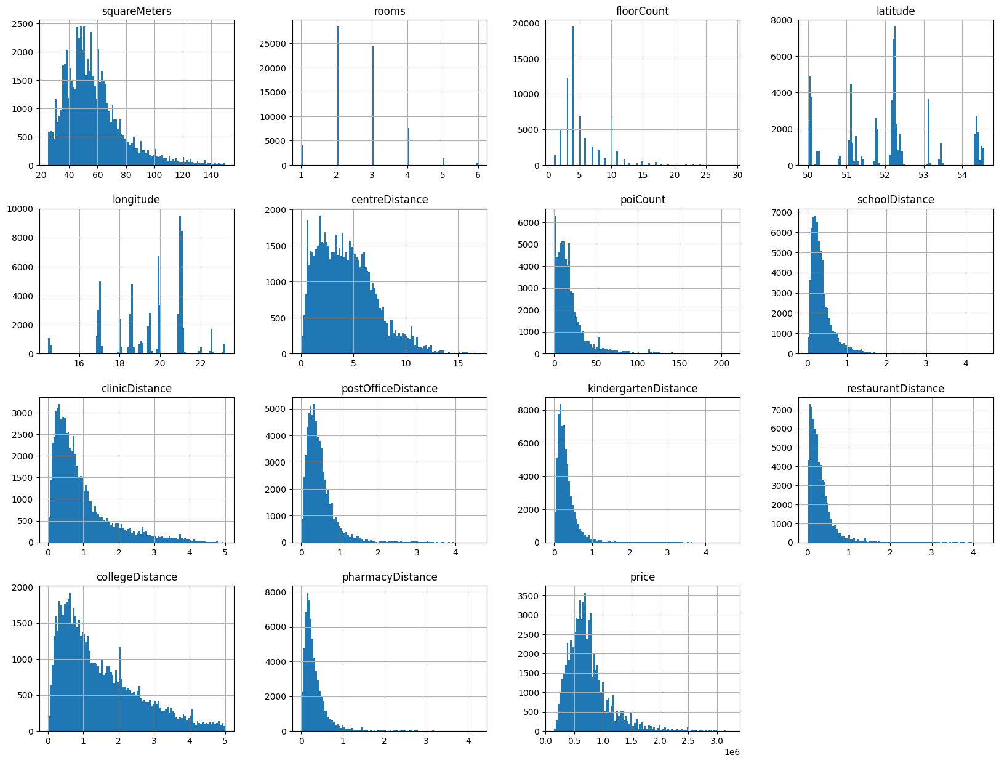

In [76]:
# Histograms

%matplotlib inline
data.hist(bins=100, figsize=(20,15))
plt.show()

In [77]:
# Locations on map
# This kind of map is loading quite long, but I think its worth it.

from folium.plugins import MarkerCluster
  
locations = list(zip(data['latitude'], data['longitude']))
m = folium.Map(
    location=[np.mean(data['latitude']), np.mean(data['longitude'])],
    zoom_start=6
)
 
marker_cluster = MarkerCluster(locations=locations)
marker_cluster.add_to(m)
m

['bialystok' 'bydgoszcz' 'czestochowa' 'gdansk' 'gdynia' 'katowice'
 'krakow' 'lodz' 'lublin' 'poznan' 'radom' 'rzeszow' 'szczecin' 'warszawa'
 'wroclaw']


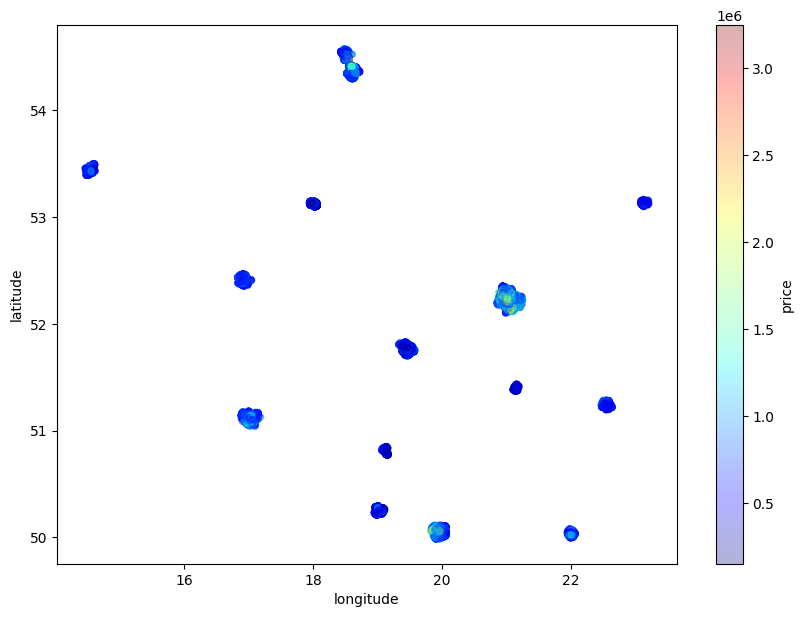

In [78]:
# Locations based on price
# TODO: do it for every city
data.plot(
    kind='scatter',
    x='longitude',
    y='latitude',
    alpha=0.3,
    figsize=(10, 7),
    c='price',
    cmap=plt.get_cmap('jet'),
    colorbar=True
)
print(np.unique(data['city']))

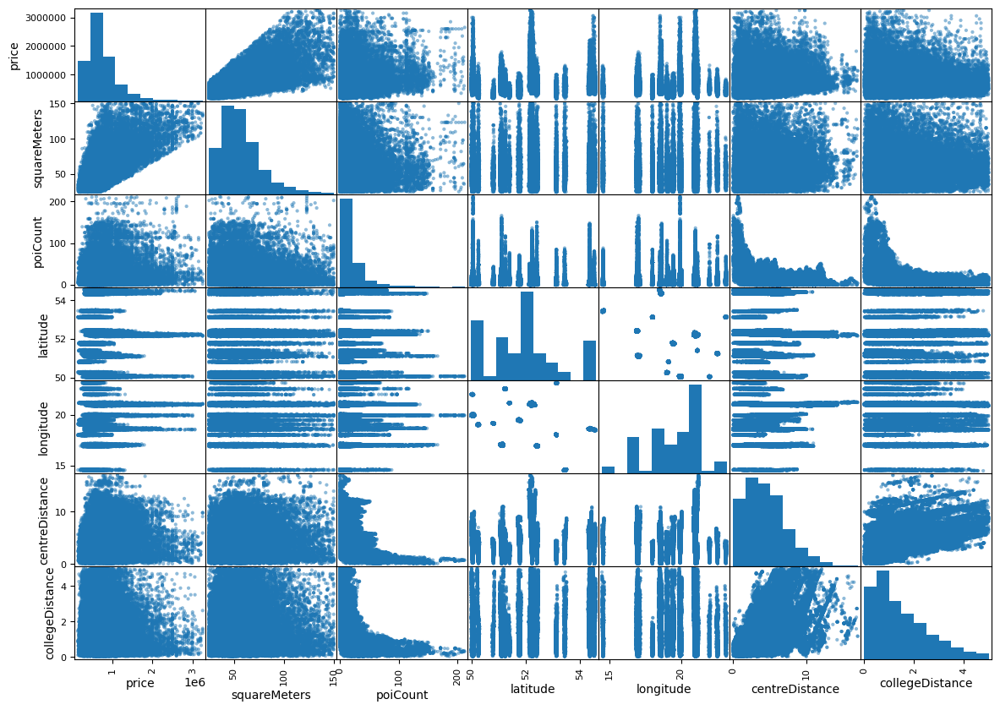

In [79]:
# Corelation matrix

%matplotlib inline
from pandas.plotting import scatter_matrix

attributes = ['price', 'squareMeters', 'poiCount', 'latitude', 'longitude', 'centreDistance', 'collegeDistance']
scatter_matrix(data[attributes], figsize=(14,10))
plt.show()

<AxesSubplot:>

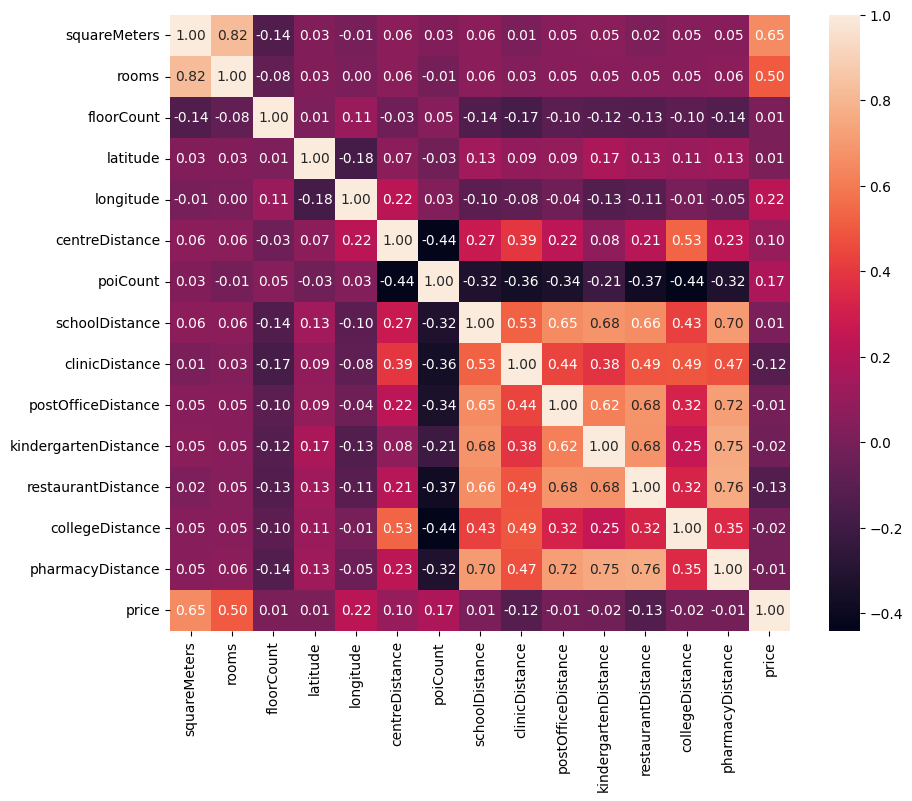

In [80]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, fmt = '.2f')

### 4. Split and build data

In [82]:
# normalization

scaler = MinMaxScaler()
numerical_columns = data.select_dtypes(include=['number']).columns
ignored_columns = [col for col in numerical_columns if 'object' not in str(data[col].dtype)]
text_columns = ['city','hasParkingSpace','hasBalcony','hasElevator','hasSecurity','hasStorageRoom','ownership']
data = data.drop(columns=text_columns)
#data = data.drop(columns=['city'])
data[ignored_columns] = scaler.fit_transform(data[ignored_columns])


In [90]:
# Shuffle data, add index and check sum.
test_ratio = 0.1 # 10% of amount is test data

y = data['price']
X = data.drop(columns=['price'])
rand_val = random.randint(0, 111)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio, random_state=rand_val)

print(f"Training set amount: {len(X_train)}\nTest set amount: {len(X_test)}")



Training set amount: 59798
Test set amount: 6645


In [91]:

X_train.head()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance
44359,0.28800,0.4,0.285714,0.489858,0.737385,0.372931,0.089623,0.097315,0.052431,0.077225,0.037401,0.088332,0.477173,0.070502
37736,0.08192,0.2,0.071429,0.687555,0.408071,0.155437,0.070755,0.023714,0.019212,0.052792,0.092114,0.047329,0.219463,0.025466
15599,0.18560,0.4,0.250000,0.484348,0.753305,0.254728,0.070755,0.092841,0.094657,0.068499,0.095747,0.090206,0.471966,0.066730
34923,0.18960,0.4,0.107143,0.271303,0.922174,0.214539,0.094340,0.081879,0.348409,0.077443,0.057277,0.065839,0.294553,0.030889
31025,0.06128,0.0,0.107143,0.978324,0.462154,0.348109,0.033019,0.078747,0.603762,0.046684,0.029921,0.077788,0.859632,0.068852


### 5. Build model - random forest regressor

In [93]:
# parameters={
#     'max_depth':list(np.arange(5, 20, step=5)),
#     'n_estimators':np.arange(5, 20, step=5),
#     'criterion':['poisson','squared_error'],
#     'min_samples_split':np.arange(2, 10, step=2)
# }

rf_reg = RandomForestRegressor(error_score='raise')
# reg = RandomizedSearchCV(rf_reg, parameters, n_iter=50, scoring='accuracy', n_jobs=-1)
reg = rf_reg.fit(X_train,y_train)
# print("Najlepsze hiperparametry: " + str(reg.best_params_))
# print("Najwyższa dokładność: "+ "{:.2f}".format(reg.best_score_))

y_pred = reg.predict(X_test)
print("Obliczona dokładność: " + "{:.2f}".format(100 * accuracy_score(y_test, y_pred)) + "%")
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Oranges')
show_accuracy(y_test, y_pred)

NameError: name 'accuracy_score' is not defined